<h1 align="center"><b> Results </b></h1>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from config import path

In [2]:
import logging
from logs import turning_logger

turning_logger.setLevel(logging.INFO)

In [3]:
SPORTS = ("basketball", "handball", "soccer", "volleyball")
BT_FILENAMES = ("first", "second", "third")
ALL_FILENAMES = SPORTS + BT_FILENAMES

path.CONTROLLING_PLOT_PATH.mkdir(parents=True, exist_ok=True)

<h2> <b>Dataset</b> </h2>

In [4]:
from data_analysis.read_datasets import read_as_dicts

In [5]:
KEYS_TO_READ = [
    "matches",
    "bt_matches",
    "stats",
    "optimal_stats",
    "bt_stats",
    "tp",
    "optimal_tp",
    "bt_tp",
]

key_to_sport_to_data = read_as_dicts(ALL_FILENAMES, KEYS_TO_READ)
key_to_sport_to_data["tp/0.99"] = read_as_dicts(SPORTS, "tp", 0.99)["tp"]
key_to_sport_to_data["stats/0.05"] = read_as_dicts(SPORTS, "stats", 0.05)["stats"]

In [6]:
import warnings
from turning_point.permutation_coefficient import get_turning_point_comparison

PERCENTILES = [2.5, 25, 50, 75, 97.5]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")

    key_to_sport_to_data["comparison_tp"] = {
        sport: get_turning_point_comparison(
            normal = key_to_sport_to_data["tp"][sport],
            optimal_tp = key_to_sport_to_data["optimal_tp"][sport],
        )
        for sport in SPORTS
    }

sport_to_num_teams = {
    sport: matches.team_names_per_id.apply(len)
    for sport, matches in key_to_sport_to_data["matches"].items()
}

In [7]:
from data_analysis.division import Division
from data_analysis.double_round_robin import FilterDRR

filter_instance = FilterDRR.from_sport_to_matches(key_to_sport_to_data["matches"])
only_drr = filter_instance.filter_double_round_robins(key_to_sport_to_data["comparison_tp"])

div_data = Division(pd.read_csv(path.DATA_PATH / "divisions.csv"))
only_div1 = div_data.filter_divisions(key_to_sport_to_data["comparison_tp"], division=1)
only_div1_drr = div_data.filter_divisions(only_drr, division=1)

<h2><b> Plots </b></h2>

In [8]:
import data_analysis.plots.utils.customization
from data_analysis.plots.utils.plot_functions import flatten_axes

In [9]:
import data_analysis.plots.comparison_scatter as comp_scatter

from data_analysis.plots.variances_temporal_progression import plot_variances_temporal_progression
from data_analysis.plots.comparison_boxplot import plot_comparison_boxplot

<h2> Temporal Progression </h2>

<h3> Real tournament </h3>

In [10]:
TOURNEY_NAMES_AND_IDS = (
    ("NBA (Basketball: 2019/20)", "nba@/basketball/usa/nba-2020-2021/"),
    ("Superleague RU (Volleyball: 2019/20)", "superleague@/volleyball/russia/superleague-2020-2021/"),
    ("La Liga (Soccer: 2019/20)", "laliga@/soccer/spain/laliga-2020-2021/"),
    ("Bundesliga (Handball: 2019/20)", "bundesliga@/handball/germany/bundesliga-2020-2021/"),
)

TEXT_PARAMS = [
    {"text_size": 30, "tp_text_y_pos": 110, "team_text_y_pos": 75, "text_ha": "right"},
    {"text_size": 30, "tp_text_y_pos": 150, "team_text_y_pos": 125, "text_ha": "left"},
    {"text_size": 30, "tp_text_y_pos": 60, "team_text_y_pos": 50, "text_ha": "right"},
    {"text_size": 30, "tp_text_y_pos": 150, "team_text_y_pos": 115, "text_ha": "left"},
]

LAST_DATE = 60

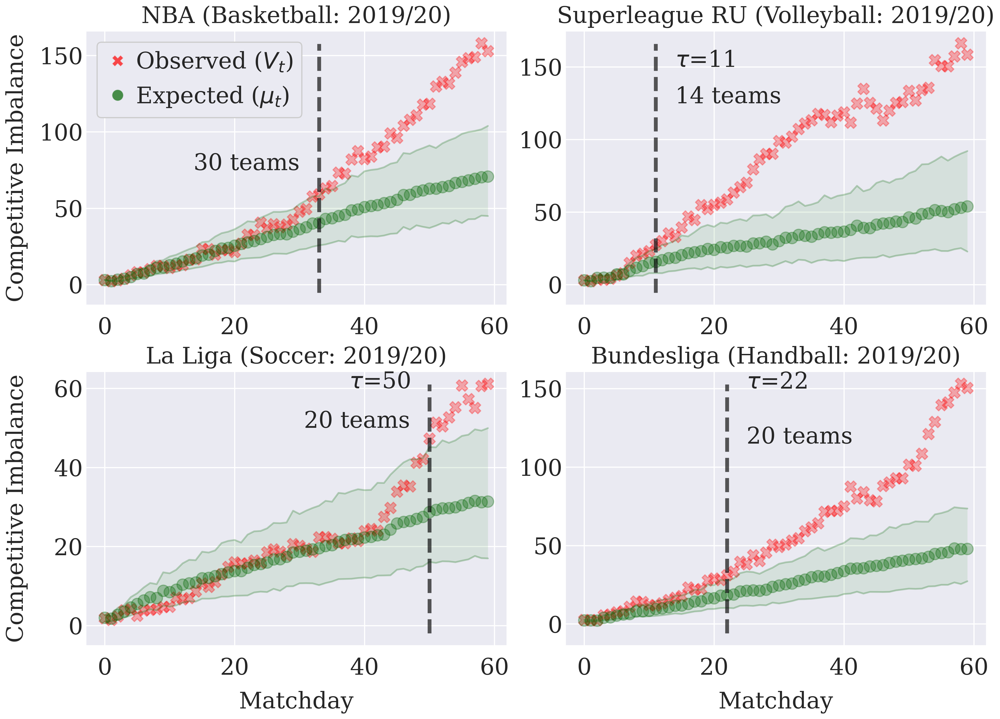

In [11]:
fig, axs = plt.subplots(2, 2, figsize=(18, 13))

plot_variances_temporal_progression(
    fig, axs,
    key_to_sport_to_data["tp"],
    key_to_sport_to_data["stats"],
    TOURNEY_NAMES_AND_IDS,
    LAST_DATE,
    key_to_sport_to_data["stats/0.05"],
    sport_to_num_teams,
    TEXT_PARAMS,
)
for ax in flatten_axes(axs):
    ax.set_title(ax.get_title(), fontsize=30)

plt.savefig(path.CONTROLLING_PLOT_PATH / "variance_progression.pdf")

<h2> Optimal Turning Point </h2>

<h3> Oracle </h3>

In [12]:
TP_COLUMNS = {
    ("%turning point", "normal"): r"Observed $\tau_\%$",
    ("%turning point", "graph_tp_maximizer_mirrored-current"): r"Graph Oracle Max $\tau_\%^{\mathrm{max}}$",
    # ("%turning point", "graph_tp_maximizer_reversed-current"): r"Graph Oracle MaxMin $\tau_\%^{\mathrm{maxmin}}$",
    # ("%turning point", "graph_tp_maximizer_random_reversed-current"): r"Graph Oracle Random MaxMin $\tau_\%^{\mathrm{CO}}$",
    # ("%turning point", "recursive_tp_maximizer_mirrored-current"): r"Recursive Oracle Min $\tau_\%^{\mathrm{min}}$",
    # ("%turning point", "recursive_tp_maximizer_reversed-current"): r"Recursive Oracle MaxMin $\tau_\%^{\mathrm{maxmin}}$",
    # ("%turning point", "recursive_tp_maximizer_random_reversed-current"): r"Recursive Oracle Random MaxMin $\tau_\%^{\mathrm{CO}}$",
}

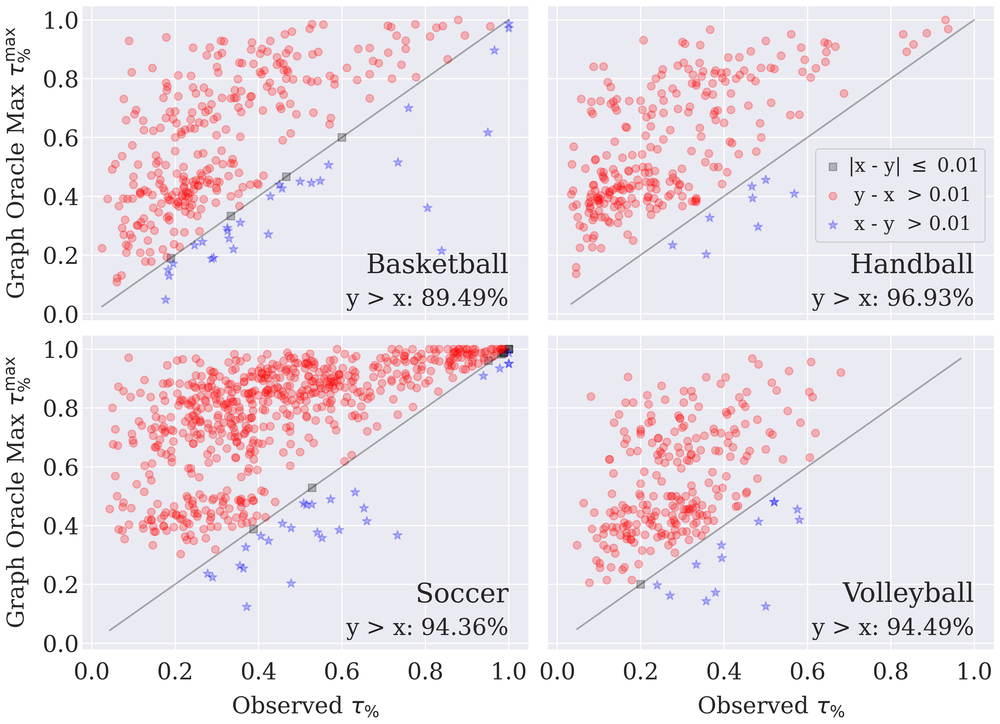

In [13]:
fig, axs = plt.subplots(2, 2, figsize=(18, 13), sharex="all", sharey="all")
flat_axs = flatten_axes(axs)

comp_scatter.plot_scatter_according_to_line_x_equals_y(
    fig, axs,
    key_to_sport_to_data["comparison_tp"],
    TP_COLUMNS,
    pearson_corr_kwargs=None,
    y_gt_x_percent_kwargs={"y": 0.01},
    title_as_text_kwargs={"y": 0.12},
)

flat_axs[1].legend(loc=(0.6, 0.25), fontsize=25)

plt.savefig(path.CONTROLLING_PLOT_PATH / f"turning_point_{TP_COLUMNS.keys()}_scatter.pdf")

<h3> Yesterday Model </h3>

In [14]:
TP_COLUMNS = {
    ("%turning point", "normal"): r"Observed $\tau_\%$",
    ("%turning point", "graph_tp_maximizer_mirrored-previous"): r"Graph Yesterday Max $\tau_\%^{\mathrm{max}}$",
    # ("%turning point", "graph_tp_maximizer_reversed-previous"): r"Graph Yesterday MaxMin $\tau_\%^{\mathrm{maxmin}}$",
    # ("%turning point", "graph_tp_maximizer_random_reversed-previous"): r"Graph Yesterday Random MaxMin $\tau_\%^{\mathrm{CO}}$",
    # ("%turning point", "recursive_tp_maximizer_mirrored-previous"): r"Recursive Yesterday Min $\tau_\%^{\mathrm{min}}$",
    # ("%turning point", "recursive_tp_maximizer_reversed-previous"): r"Recursive Yesterday MaxMin $\tau_\%^{\mathrm{maxmin}}$",
    # ("%turning point", "recursive_tp_maximizer_random_reversed-previous"): r"Recursive Yesterday Random MaxMin $\tau_\%^{\mathrm{CO}}$",
}

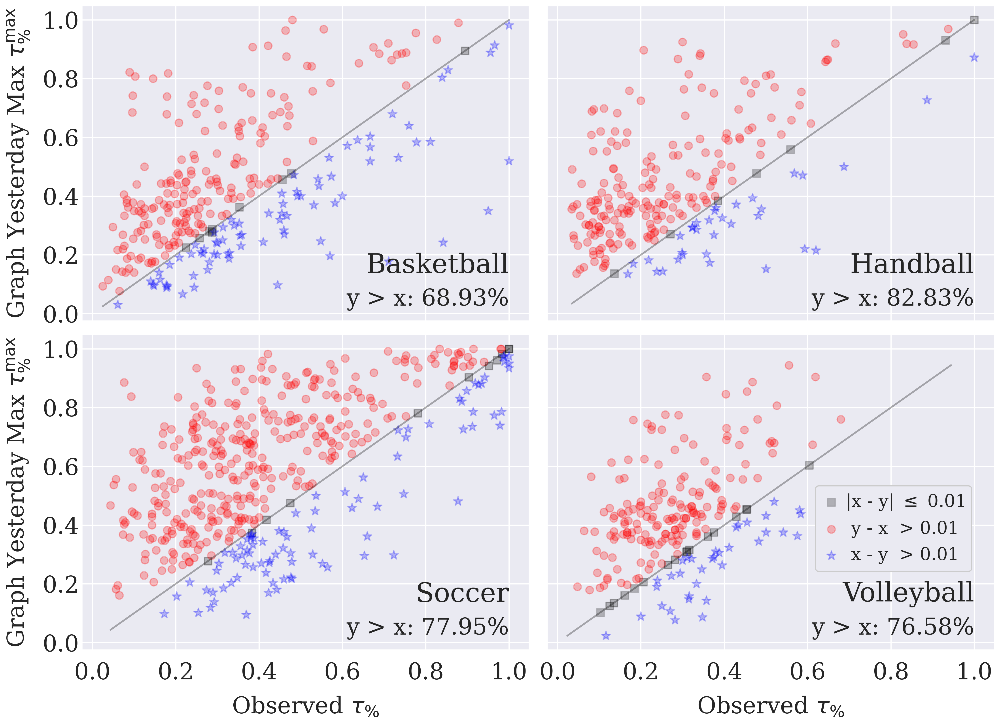

In [15]:
fig, axs = plt.subplots(2, 2, figsize=(18, 13), sharex="all", sharey="all")
flat_axs = flatten_axes(axs)

comp_scatter.plot_scatter_according_to_line_x_equals_y(
    fig, axs,
    only_div1,
    TP_COLUMNS,
    pearson_corr_kwargs=None,
    y_gt_x_percent_kwargs={"y": 0.01},
    title_as_text_kwargs={"y": 0.12},
)

flat_axs[-1].legend(loc=(0.6, 0.25), fontsize=23)

plt.savefig(path.CONTROLLING_PLOT_PATH / f"turning_point_{TP_COLUMNS.keys()}_scatter.pdf")

<h3> Soccer </h3>

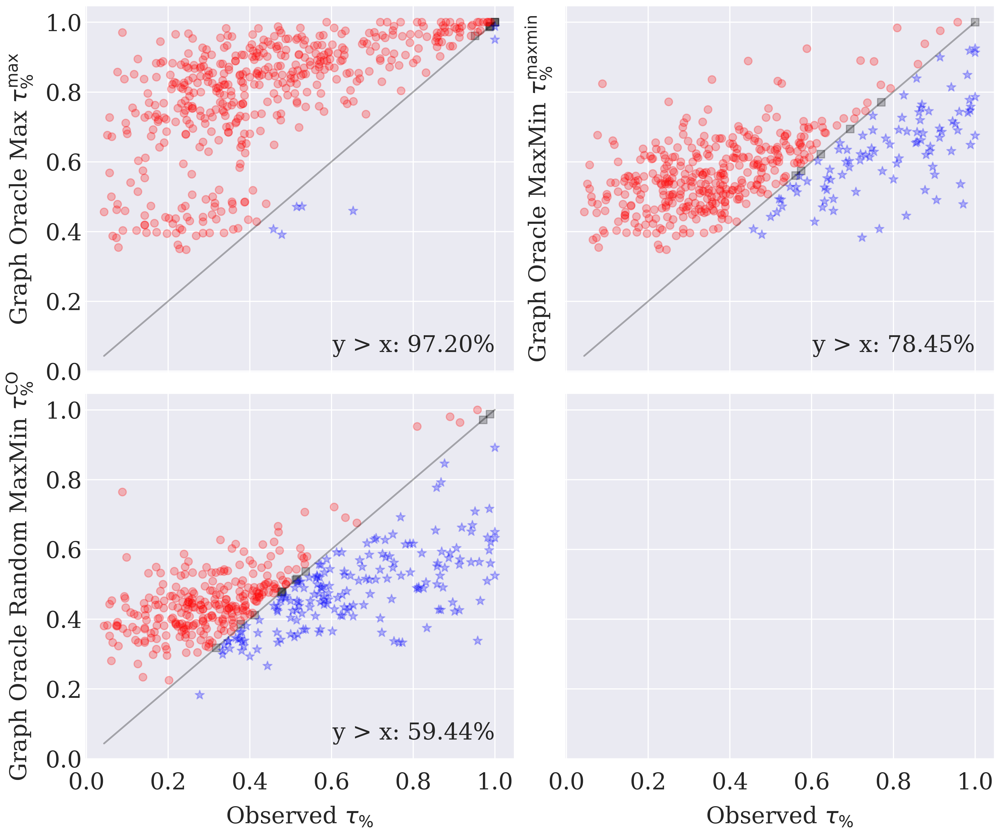

In [16]:
fig, axs = plt.subplots(2, 2, figsize=(18, 15), sharex="all", sharey="all")
flat_axs = flatten_axes(axs)

SPORT = "soccer"
TP_COLUMN = "%turning point"
SCATTER_COLUMNS = {
    (TP_COLUMN, "normal"): r"Observed $\tau_\%$",
    ("%turning point", "graph_tp_maximizer_mirrored-current"): r"Graph Oracle Max $\tau_\%^{\mathrm{max}}$",
    ("%turning point", "graph_tp_maximizer_reversed-current"): r"Graph Oracle MaxMin $\tau_\%^{\mathrm{maxmin}}$",
    ("%turning point", "graph_tp_maximizer_random_reversed-current"): r"Graph Oracle Random MaxMin $\tau_\%^{\mathrm{CO}}$",
    # ("%turning point", "recursive_tp_maximizer_mirrored-current"): r"Recursive Oracle Min $\tau_\%^{\mathrm{min}}$",
    # ("%turning point", "recursive_tp_maximizer_reversed-current"): r"Recursive Oracle MaxMin $\tau_\%^{\mathrm{maxmin}}$",
    # ("%turning point", "recursive_tp_maximizer_random_reversed-current"): r"Recursive Oracle Random MaxMin $\tau_\%^{\mathrm{CO}}$",
}

comp_scatter.plot_scatter_according_to_line_x_equals_y(
    fig, axs,
    only_drr[SPORT], #key_to_sport_to_data["comparison_tp"]["soccer"],
    SCATTER_COLUMNS,
    pearson_corr_kwargs=None,
    y_gt_x_percent_kwargs={"y": 0.04},
    title_as_text_kwargs=None,
)
plt.savefig(path.CONTROLLING_PLOT_PATH / f"scatter_optimal_{SCATTER_COLUMNS.keys()}_{SPORT}.pdf")

<h2><b> Numerical Analysis </b></h2>

In [17]:
{
    sport: matches.df.index.get_level_values("id").unique().size
    for sport, matches in key_to_sport_to_data["matches"].items()
}

{'basketball': 322, 'handball': 263, 'soccer': 698, 'volleyball': 256}

In [18]:
{
    sport: len(matches.df)
    for sport, matches in key_to_sport_to_data["matches"].items()
}

{'basketball': 72880, 'handball': 37956, 'soccer': 173196, 'volleyball': 27682}

<h3> Statistical data </h3>

In [19]:
OPTIMAL_COLUMNS = [
    "graph_tp_maximizer_mirrored-current",
    "graph_tp_maximizer_mirrored-previous",
    "graph_tp_maximizer_random_reversed-current",
    "graph_tp_maximizer_random_reversed-previous",
    "graph_tp_maximizer_reversed-current",
    "graph_tp_maximizer_reversed-previous",
    "graph_tp_minimizer_mirrored-current",
    "graph_tp_minimizer_mirrored-previous",
    "recursive_tp_maximizer_mirrored-current",
    "recursive_tp_maximizer_mirrored-previous",
    "recursive_tp_maximizer_random_reversed-current",
    "recursive_tp_maximizer_random_reversed-previous",
    "recursive_tp_maximizer_reversed-current",
    "recursive_tp_maximizer_reversed-previous",
    "recursive_tp_minimizer_mirrored-current",
    "recursive_tp_minimizer_mirrored-previous",
]

<h3> Bradley-Terry Validation </h3>

In [20]:
from data_analysis.numeric_analysis import get_validation_summary_all_files

TP_COLUMN = "%turning point"
val_summary = get_validation_summary_all_files(key_to_sport_to_data["bt_tp"], BT_FILENAMES, TP_COLUMN)

In [21]:
pd.concat({key: summary.mean(axis="columns") for key, summary in val_summary.items()}, axis="columns")

,first,second,third
graph optimal,0.430000,0.382222,0.234444
recursive optimal,0.455556,0.342222,0.221111
average permutation,0.346516,0.247280,0.158209
median permutation,0.351667,0.242222,0.156667
graph diff < 0,0.255040,0.142240,0.103360
avg graph diff [graph < 0],3.269388,2.395859,1.545921
avg graph diff [graph > 0],5.748660,5.997603,3.422542
recursive diff < 0,0.233760,0.220720,0.260880
avg recursive diff [recursive < 0],2.758155,2.413449,1.889481
avg recursive diff [recursive > 0],6.044712,5.063654,3.391135


<h3> Mean per tournament </h3>

In [22]:
from data_analysis.numeric_analysis import get_mean_per_tournament
sport_order = ["soccer", "basketball", "volleyball", "handball"]

COLUMNS = [
    ("%turning point", "normal"),
    ("%turning point", "graph_tp_maximizer_mirrored-current"),
    ("%turning point", "recursive_tp_maximizer_mirrored-current"),
    ("%turning point", "graph_tp_maximizer_mirrored-previous"),
    ("%turning point", "recursive_tp_maximizer_mirrored-previous"),
]

mean_per_tournament = get_mean_per_tournament(
    key_to_sport_to_data["comparison_tp"],
    COLUMNS,
    sort_by=("%turning point", "normal"),
)

mean_per_tournament.groupby("sport", as_index=False).nth(list(range(3))).loc[sport_order]

%turning point  \
                                                normal   
sport      name                 country                  
soccer     premier-league       england       0.235086   
           serie-a              italy         0.239803   
           liga-pro             ecuador       0.263158   
basketball b-league             japan         0.116743   
           nba                  usa           0.118441   
           cba                  china         0.156923   
volleyball superleague          ukraine       0.171699   
           divizia-a1           romania       0.216774   
           superlega            italy         0.221429   
handball   nb-i                 hungary       0.110683   
           liga-nationala-women romania       0.122185   
           bundesliga           germany       0.137744   

                                                                             \
                                        graph_tp_maximizer_mirrored-current   
sport      name                 country                                       
soccer     premier-league       england                            0.612622   
           serie-a              italy                              0.608842   
           liga-pro             ecuador                            0.877193   
basketball b-league             japan                              0.155521   
           nba                  usa                                0.339564   
           cba                  china                              0.456350   
volleyball superleague          ukraine                            0.311779   
           divizia-a1           romania                            0.470304   
           superlega            italy                              0.486164   
handball   nb-i                 hungary                            0.435644   
           liga-nationala-women romania                            0.480640   
           bundesliga           germany                            0.461922   

                                                                                 \
                                        recursive_tp_maximizer_mirrored-current   
sport      name                 country                                           
soccer     premier-league       england                                0.643317   
           serie-a              italy                                  0.606914   
           liga-pro             ecuador                                0.763158   
basketball b-league             japan                                  0.201485   
           nba                  usa                                    0.345760   
           cba                  china                                  0.480723   
volleyball superleague          ukraine                                0.308006   
           divizia-a1           romania                                0.415018   
           superlega            italy                                  0.504972   
handball   nb-i                 hungary                                0.449939   
           liga-nationala-women romania                                0.484287   
           bundesliga           germany                                0.474954   

                                                                              \
                                        graph_tp_maximizer_mirrored-previous   
sport      name                 country                                        
soccer     premier-league       england                             0.462328   
           serie-a              italy                               0.428585   
           liga-pro             ecuador                                  NaN   
basketball b-league             japan                               0.175764   
           nba                  usa                                 0.170377   
           cba                  china                               0.256776   
volleyball superl

In [23]:
soccer = mean_per_tournament.loc["soccer"].reset_index()
soccer[soccer["country"].isin({"brazil", "france", "germany"})]

name  country %turning point                                      \
                                  normal graph_tp_maximizer_mirrored-current   
11    bundesliga  germany       0.311907                            0.750877   
22       ligue-1   france       0.371053                            0.777490   
49       serie-a   brazil       0.507180                            0.907235   
51  2-bundesliga  germany       0.537065                            0.936369   
65       serie-b   brazil       0.628847                            0.921648   

                                            \
   recursive_tp_maximizer_mirrored-current   
11                                0.742018   
22                                0.748455   
49                                0.880355   
51                                0.910301   
65                                0.905632   

                                         \
   graph_tp_maximizer_mirrored-previous   
11                             0.569297   
22                             0.559524   
49                             0.673322   
51                             0.628384   
65                             0.647585   

                                             
   recursive_tp_maximizer_mirrored-previous  
11                                 0.527236  
22                                 0.498099  
49                                 0.650517  
51                                 0.609903  
65                                 0.605172

<h3> Balance Increase </h3>

In [24]:
from data_analysis.numeric_analysis import get_balance_increase_all_sports

TP_COLUMN = "%turning point"
args = (SPORTS, OPTIMAL_COLUMNS, TP_COLUMN)
balance_increase = {
    "all": get_balance_increase_all_sports(key_to_sport_to_data["comparison_tp"], *args),
    "drr": get_balance_increase_all_sports(only_drr, *args),
    "div1": get_balance_increase_all_sports(only_div1, *args),
    "drr_div1": get_balance_increase_all_sports(only_div1_drr, *args),
}

In [25]:
pd.set_option('display.max_rows', None)

pd.concat(
    {
        key: pd.concat(df, axis="columns") 
        for key, df in balance_increase.items()
    }, axis="columns"
).transpose()

size  \
all      basketball graph_tp_maximizer_mirrored-current              322.0   
                    graph_tp_maximizer_mirrored-previous             322.0   
                    graph_tp_maximizer_random_reversed-current       322.0   
                    graph_tp_maximizer_random_reversed-previous      322.0   
                    graph_tp_maximizer_reversed-current              322.0   
                    graph_tp_maximizer_reversed-previous             322.0   
                    graph_tp_minimizer_mirrored-current              322.0   
                    graph_tp_minimizer_mirrored-previous             322.0   
                    recursive_tp_maximizer_mirrored-current          322.0   
                    recursive_tp_maximizer_mirrored-previous         322.0   
                    recursive_tp_maximizer_random_reversed-current   322.0   
                    recursive_tp_maximizer_random_reversed-previous  322.0   
                    recursive_tp_maximizer_reversed-current          322.0   
                    recursive_tp_maximizer_reversed-previous         322.0   
                    recursive_tp_minimizer_mirrored-current          322.0   
                    recursive_tp_minimizer_mirrored-previous         322.0   
         handball   graph_tp_maximizer_mirrored-current              263.0   
                    graph_tp_maximizer_mirrored-previous             263.0   
                    graph_tp_maximizer_random_reversed-current       263.0   
                    graph_tp_maximizer_random_reversed-previous      263.0   
                    graph_tp_maximizer_reversed-current              263.0   
                    graph_tp_maximizer_reversed-previous             263.0   
                    graph_tp_minimizer_mirrored-current              263.0   
                    graph_tp_minimizer_mirrored-previous             263.0   
                    recursive_tp_maximizer_mirrored-current          263.0   
                    recursive_tp_maximizer_mirrored-previous         263.0   
                    recursive_tp_maximizer_random_reversed-current   263.0   
                    recursive_tp_maximizer_random_reversed-previous  263.0   
                    recursive_tp_maximizer_reversed-current          263.0   
                    recursive_tp_maximizer_reversed-previous         263.0   
                    recursive_tp_minimizer_mirrored-current          263.0   
                    recursive_tp_minimizer_mirrored-previous         263.0   
         soccer     graph_tp_maximizer_mirrored-current              698.0   
                    graph_tp_maximizer_mirrored-previous             698.0   
                    graph_tp_maximizer_random_reversed-current       698.0   
                    graph_tp_maximizer_random_reversed-previous      698.0   
                    graph_tp_maximizer_reversed-current              698.0   
                    graph_tp_maximizer_reversed-previous             698.0   
                    graph_tp_minimizer_mirrored-current              698.0   
                    graph_tp_minimizer_mirrored-previous             698.0   
                    recursive_tp_maximizer_mirrored-current          698.0   
                    recursive_tp_maximizer_mirrored-previous         698.0   
                    recursive_tp_maximizer_random_reversed-current   698.0   
                    recursive_tp_maximizer_random_reversed-previous  698.0   
                    recursive_tp_maximizer_reversed-current          698.0   
                    recursive_tp_maximizer_reversed-previous         698.0   
                    recursive_tp_minimizer_mirrored-current          698.0   
                    recursive_tp_minimizer_mirrored-previous         698.0   
         volleyball graph_tp_maximizer_mirrored-current              256.0   
                    graph_tp_maximizer_mirrored-previous             256.0   
                    graph_tp_maximizer_random_reversed-current       256.0   
              